<a href="https://colab.research.google.com/github/Jatansahu/FABRIC-DEFECT-DETECTION-DEEP-LEARNING/blob/main/Datasets_description.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

#**DATASET 01 - fabric-defect-dataset**

DATASET LINK - https://www.kaggle.com/datasets/rmshashi/fabric-defect-dataset

In [ ]:
! kaggle datasets download rmshashi/fabric-defect-dataset

 96% 204M/213M [00:02<00:00, 96.8MB/s]
100% 213M/213M [00:02<00:00, 75.9MB/s]


In [ ]:
! unzip /content/fabric-defect-dataset.zip -d  /content/fabric-defect-dataset

Archive:  /content/fabric-defect-dataset.zip
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_134722.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_134730.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135018.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135032(1).jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135032.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135038.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135110.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135111.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135129(1).jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captured/Hole/20180531_135129.jpg  
  inflating: /content/fabric-defect-dataset/Data Set/captur

In [ ]:
path = "/content/fabric-defect-dataset"

#A. Number of defect classes

In [ ]:
#Dataset type
type = os.listdir('/content/fabric-defect-dataset/Data Set')
print(type)

['hole', 'captured', 'horizontal', 'verticle']


In [ ]:
print("Types of defect types :",len(type))

Types of defect types : 4


In [ ]:
defects = []
for item in type:
  all_defects = os.listdir('/content/fabric-defect-dataset/Data Set' + '/' + item)
  for defect in all_defects:
     defects.append((item,str('/content/fabric-defect-dataset/Data Set' + '/' + item) + '/' + defect))

#Types of defect types : 4

#B. Number of images

In [ ]:
#Building dataframes
import pandas as pd
defect_df = pd.DataFrame(data= defects , columns=['defect type', 'image'])
print(defect_df.head())
print(defect_df.tail())

  defect type                                              image
0        hole  /content/fabric-defect-dataset/Data Set/hole/3...
1        hole  /content/fabric-defect-dataset/Data Set/hole/2...
2        hole  /content/fabric-defect-dataset/Data Set/hole/1...
3        hole  /content/fabric-defect-dataset/Data Set/hole/1...
4        hole  /content/fabric-defect-dataset/Data Set/hole/7...
    defect type                                              image
409    verticle  /content/fabric-defect-dataset/Data Set/vertic...
410    verticle  /content/fabric-defect-dataset/Data Set/vertic...
411    verticle  /content/fabric-defect-dataset/Data Set/vertic...
412    verticle  /content/fabric-defect-dataset/Data Set/vertic...
413    verticle  /content/fabric-defect-dataset/Data Set/vertic...


In [ ]:
# Let's check how many samples for each category are present
print("Total number of images in the dataset: ", len(defect_df))

Total number of images in the dataset:  414


#Total number of images in the dataset:  414

#C. Number of defects per class

In [ ]:
duplicate_counts = defect_df['defect type'].value_counts()

print(duplicate_counts)

hole          184
horizontal    136
verticle       92
captured        2
Name: defect type, dtype: int64


#d. Number of defects per class per image

#**2 Dataset - Annotated fabric defect dataset**

Link - https://github.com/msminhas93/FabricDefect/tree/master/FabricDataset

In [ ]:
!git clone https://github.com/msminhas93/FabricDefect.git

fatal: destination path 'FabricDefect' already exists and is not an empty directory.


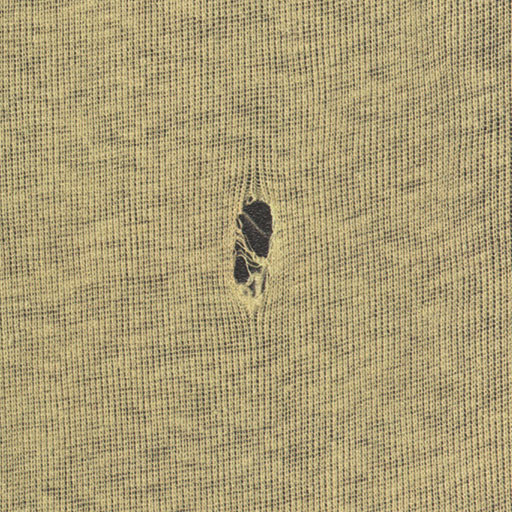

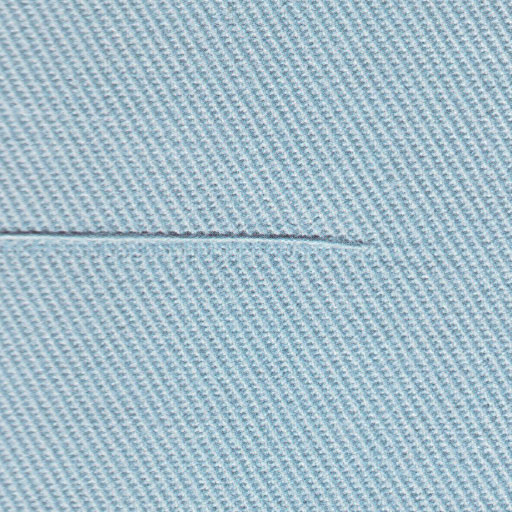

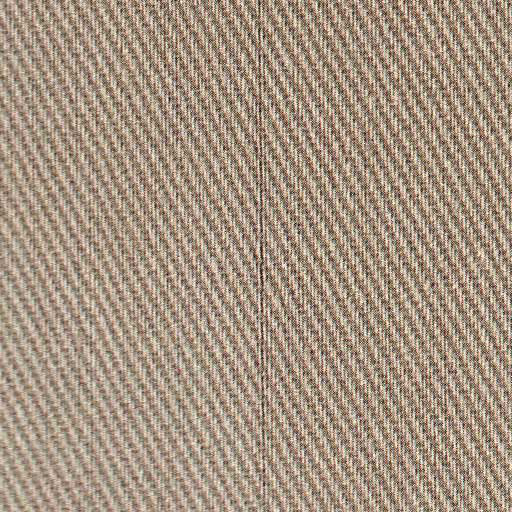

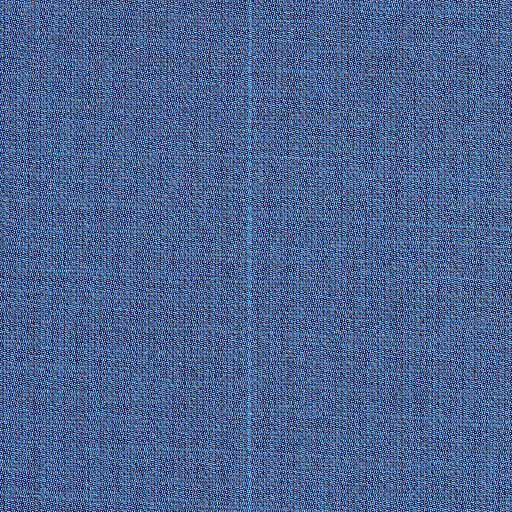

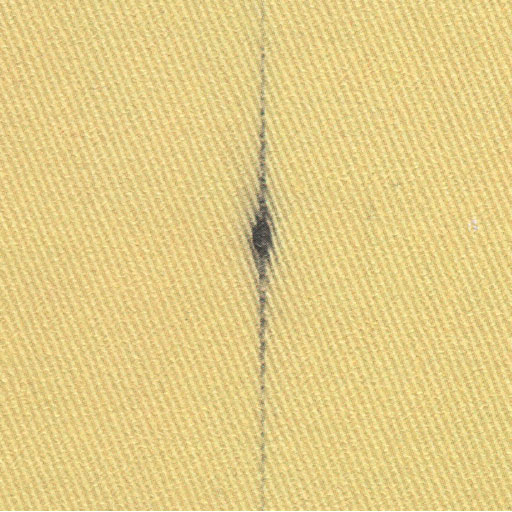

...

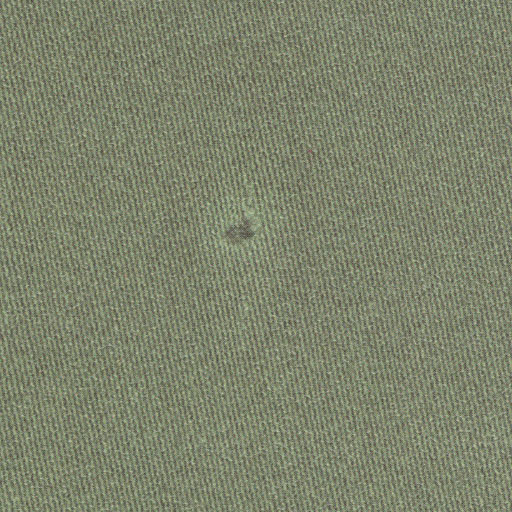

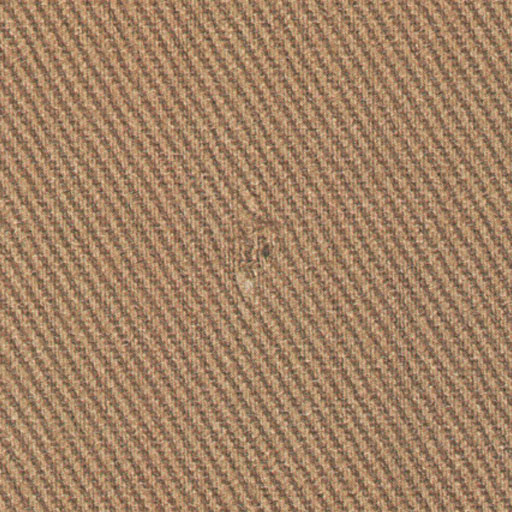

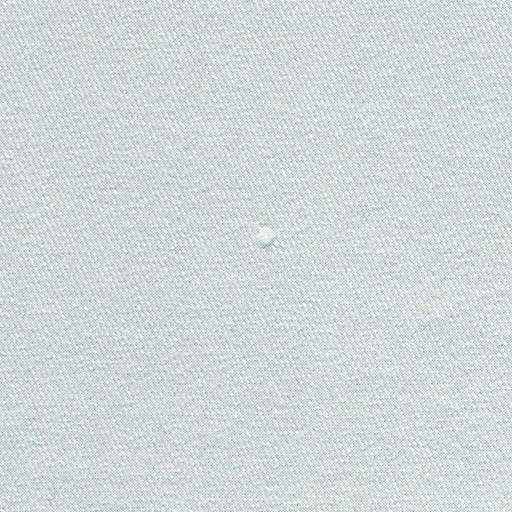

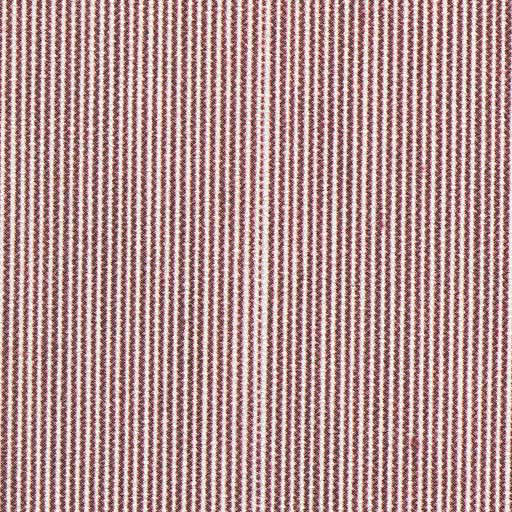

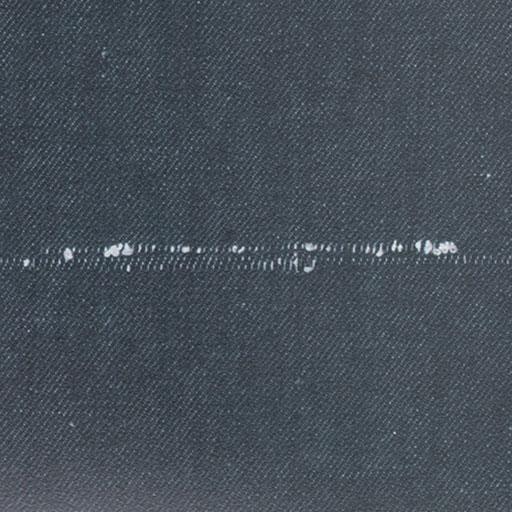

In [ ]:
from PIL import Image
import os
repo_path = '/content/FabricDefect'
image_dir = os.path.join(repo_path, 'FabricDataset/Images')

image_files = os.listdir(image_dir)
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    image = Image.open(image_path)
    image.show()

In [ ]:
from PIL import Image
import os

repo_path = '/content/FabricDefect'
mask_dir = os.path.join(repo_path, 'FabricDataset/Masks')

mask_files = os.listdir(mask_dir)
for mask_file in mask_files:
    mask_path = os.path.join(mask_dir, mask_file)
    mask = Image.open(mask_path)

    # mask.show()

In [ ]:
# image = Image.open("/content/FabricDefect/Results/FabricFilter.png")
# image = Image.open("/content/FabricDefect/Results/fabricfilter_m25.png")
# image.show()

#A)Number of images

In [ ]:
print("Total number of images in the dataset: ", len(image_files))

Total number of images in the dataset:  24


In [ ]:
image_files[0]

'Fabric23.jpg'

In [ ]:
# Get the size of the image
image = Image.open("/content/FabricDefect/FabricDataset/Images/Fabric1.jpg")
image_size = image.size

# Print the width and height of the image
width, height = image_size
print("Image width:", width)
print("Image height:", height)

Image width: 512
Image height: 512


In [ ]:
# Let's check how many samples for each category are present
print("Total number of mask for each in the dataset: ", len(mask_files))

Total number of mask for each in the dataset:  24


#We have an annotated fabric defect dataset that contains 24 images. Each image in the dataset has a size of 512x512 pixels. Additionally, there is a corresponding mask available for each image, which indicates the areas of the fabric where defects are present. The masks are aligned with their respective images, providing pixel-level annotations for the fabric defects.

#B. Number of defect classes

In [ ]:
# import os
# from PIL import Image
# import numpy as np
# mask_dir = '/content/FabricDefect/FabricDataset/Masks'

# defect_classes = set()


# for filename in os.listdir(mask_dir):

#     mask_path = os.path.join(mask_dir, filename)
#     mask = Image.open(mask_path)
#     mask_array = np.array(mask)
#     unique_values = np.unique(mask_array)
#     defect_classes.update(unique_values)
# num_defect_classes = len(defect_classes)
# print("Number of defect classes:", num_defect_classes)


#Number of defect classes: 2

#C. Number of defects per class

In [ ]:
import os
from PIL import Image
import numpy as np

mask_dir = '/content/FabricDefect/FabricDataset/Masks'

defect_counts = {}

for filename in os.listdir(mask_dir):

    mask_path = os.path.join(mask_dir, filename)
    mask = Image.open(mask_path)


    mask_array = np.array(mask)

    # Get the unique values in the mask array
    unique_values = np.unique(mask_array)


    defect_values = unique_values[1:]

    # Update the defect_counts dictionary
    for defect_value in defect_values:
        if defect_value not in defect_counts:
            defect_counts[defect_value] = 1
        else:
            defect_counts[defect_value] += 1

# Calculate the number of defect classes
num_defect_classes = len(defect_counts)

print("Number of defect classes:", num_defect_classes)
for defect_class, count in defect_counts.items():
    print(f"Defect Class {defect_class}: {count} defects")


Number of defect classes: 1
Defect Class 255: 24 defects


#**DATASET 02 -textiledefectdetection**

link - https://www.kaggle.com/datasets/belkhirnacim/textiledefectdetection

In [ ]:
! kaggle datasets download belkhirnacim/textiledefectdetection

100% 3.40G/3.40G [02:34<00:00, 26.4MB/s]
100% 3.40G/3.40G [02:34<00:00, 23.7MB/s]


In [ ]:
! unzip /content/textiledefectdetection.zip -d  /content/textiledefectdetection

Archive:  /content/textiledefectdetection.zip
  inflating: /content/textiledefectdetection/matchingtDATASET_test_32.h5  
  inflating: /content/textiledefectdetection/matchingtDATASET_test_64.h5  
  inflating: /content/textiledefectdetection/matchingtDATASET_train_32.h5  
  inflating: /content/textiledefectdetection/matchingtDATASET_train_64.h5  
  inflating: /content/textiledefectdetection/test32.csv  
  inflating: /content/textiledefectdetection/test32.h5  
  inflating: /content/textiledefectdetection/test64.csv  
  inflating: /content/textiledefectdetection/test64.h5  
  inflating: /content/textiledefectdetection/train32.csv  
  inflating: /content/textiledefectdetection/train32.h5  
  inflating: /content/textiledefectdetection/train64.csv  
  inflating: /content/textiledefectdetection/train64.h5  


In [ ]:
import h5py

# Specify the file path
file_path = "/content/textiledefectdetection"

# Open the HDF5 file
file = h5py.File(file_path, "r")

# Access the datasets or groups within the file
# For example, to access a dataset named "data":
dataset = file["/content/textiledefectdetection/matchingtDATASET_test_32.h5"]

# Perform operations on the dataset
# For example, to print the shape of the dataset:
print("Dataset shape:", dataset.shape)

# Close the file
file.close()


In [ ]:
path = "/content/textiledefectdetection/"

#A. Number of defect classes

In [ ]:
#Dataset type
type = os.listdir('/content/textiledefectdetection/matchingtDATASET_test_32.h5')
print(type)

In [ ]:
print("Types of defect types :",len(type))

Types of defect types : 12


#B. Number of images

In [ ]:
defects = []
for item in type:
  all_defects = os.listdir('/content/fabric-defect-dataset/Data Set' + '/' + item)
  for defect in all_defects:
     defects.append((item,str('/content/fabric-defect-dataset/Data Set' + '/' + item) + '/' + defect))

In [ ]:
#Building dataframes
import pandas as pd
defect_df = pd.DataFrame(data= defects , columns=['defect type', 'image'])
print(defect_df.head())
print(defect_df.tail())

In [ ]:
# Let's check how many samples for each category are present
print("Total number of images in the dataset: ", len(defect_df))

#C. Number of defects per class

In [ ]:
duplicate_counts = defect_df['defect type'].value_counts()

print(duplicate_counts)

In [ ]:
df = pd.read_csv("/content/textiledefectdetection/test32.csv")

In [ ]:
df

,index,angle,indication_type,indication_value,split
0,0,40,good,0,test
1,1,80,good,0,test
2,2,60,good,0,test
3,3,0,good,0,test
4,4,140,good,0,test
...,...,...,...,...,...
47995,47995,20,thread,4,test
47996,47996,100,thread,4,test
47997,47997,100,thread,4,test
47998,47998,140,thread,4,test
